In [1]:
import pandas as pd
import os
import hvplot.pandas
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
pd.set_option('display.max_columns', None)


In [2]:
# Loading data
filepath = "../Resources/City_envo_hpi.csv"
df = pd.read_csv(filepath)
df.head(10)

,stateabbr,placename,placefips,tractfips,place_tractid,population2010,insurance,highbloodpressure,cancer,asthma,heartdisease,annualcheckups,smokes,mentalhealthissues,latitude,longitude,countyfips,State,StateAbbr,County,CountyFIPS,Asthma,AFHeartDisease,COPD,Depression,HeartFailure,Hypertension,CoronaryArtery,Psychotic,Stroke,TotalCost,tract,hpi,Place_TractID,SiteId,PM2.5_Exceptional,PM2.5_ExceedCount,PM2.5_Max,Ozone_Exceptional,Ozone_ExceedCount,Ozone_Max,sfcount
0,AL,Birmingham,107000,1073003200,0107000-01073003200,931,26.8,57.0,6.0,14.4,11.1,78.2,29.6,22.0,33.509402,-86.885908,1073,Alabama,AL,Jefferson,1073,21757.522534,27331.927441,27268.357869,22037.223923,30255.834117,15218.437417,21404.634337,22090.977918,34328.945095,472312.202094,1.073003e+09,147.35,0107000-01073003200,11.0,0.0,0.0,26.6,0.0,1.0,0.078,0.0
1,AL,Birmingham,107000,1073003300,0107000-01073003300,947,21.4,55.2,6.8,12.9,9.7,80.1,22.6,16.7,33.517126,-86.891382,1073,Alabama,AL,Jefferson,1073,21757.522534,27331.927441,27268.357869,22037.223923,30255.834117,15218.437417,21404.634337,22090.977918,34328.945095,472312.202094,1.073003e+09,211.99,0107000-01073003300,11.0,0.0,0.0,26.6,0.0,1.0,0.078,0.0
2,AL,Birmingham,107000,1073010500,0107000-01073010500,114,23.9,60.5,7.1,13.6,11.1,80.7,26.5,18.6,33.436379,-86.912892,1073,Alabama,AL,Jefferson,1073,21757.522534,27331.927441,27268.357869,22037.223923,30255.834117,15218.437417,21404.634337,22090.977918,34328.945095,472312.202094,1.073010e+09,167.48,0107000-01073010500,11.0,0.0,0.0,26.6,0.0,1.0,0.078,0.0
3,AL,Birmingham,107000,1073010701,0107000-01073010701,74,19.8,24.9,2.7,11.2,2.4,66.2,18.1,16.1,33.473886,-86.814649,1073,Alabama,AL,Jefferson,1073,21757.522534,27331.927441,27268.357869,22037.223923,30255.834117,15218.437417,21404.634337,22090.977918,34328.945095,472312.202094,1.073011e+09,670.86,0107000-01073010701,11.0,0.0,0.0,26.6,0.0,1.0,0.078,0.0
4,AL,Birmingham,107000,1073010801,0107000-01073010801,168,7.3,33.0,7.4,8.9,4.5,73.7,8.5,8.8,33.514098,-86.746697,1073,Alabama,AL,Jefferson,1073,21757.522534,27331.927441,27268.357869,22037.223923,30255.834117,15218.437417,21404.634337,22090.977918,34328.945095,472312.202094,1.073011e+09,607.68,0107000-01073010801,11.0,0.0,0.0,26.6,0.0,1.0,0.078,1.0
5,AL,Birmingham,107000,1073010802,0107000-01073010802,172,6.6,37.2,11.2,8.4,6.8,75.8,7.7,8.3,33.488549,-86.780843,1073,Alabama,AL,Jefferson,1073,21757.522534,27331.927441,27268.357869,22037.223923,30255.834117,15218.437417,21404.634337,22090.977918,34328.945095,472312.202094,1.073011e+09,670.86,0107000-01073010802,11.0,0.0,0.0,26.6,0.0,1.0,0.078,0.0
6,AL,Birmingham,107000,1073010803,0107000-01073010803,514,12.5,31.7,5.7,9.9,4.2,70.4,15.1,12.2,33.522909,-86.710262,1073,Alabama,AL,Jefferson,1073,21757.522534,27331.927441,27268.357869,22037.223923,30255.834117,15218.437417,21404.634337,22090.977918,34328.945095,472312.202094,1.073011e+09,607.68,0107000-01073010803,11.0,0.0,0.0,26.6,0.0,1.0,0.078,0.0
7,AL,Birmingham,107000,1073010805,0107000-01073010805,86,9.7,49.6,7.8,9.8,6.2,80.8,10.3,9.0,33.495279,-86.698718,1073,Alabama,AL,Jefferson,1073,21757.522534,27331.927441,27268.357869,22037.223923,30255.834117,15218.437417,21404.634337,22090.977918,34328.945095,472312.202094,1.073011e+09,607.68,0107000-01073010805,11.0,0.0,0.0,26.6,0.0,1.0,0.078,0.0
8,AL,Birmingham,107000,1073011207,0107000-01073011207,815,19.2,39.3,4.6,12.7,4.8,74.6,21.6,16.8,33.671885,-86.677251,1073,Alabama,AL,Jefferson,1073,21757.522534,27331.927441,27268.357869,22037.223923,30255.834117,15218.437417,21404.634337,22090.977918,34328.945095,472312.202094,1.073011e+09,210.11,0107000-01073011207,11.0,0.0,0.0,26.6,0.0,1.0,0.078,0.0
9,AL,Birmingham,107000,1073011803,0107000-01073011803,928,20.9,42.1,5.1,12.9,5.7,74.3,24.0,18.1,33.625258,-86.699861,1073,Alabama,AL,Jefferson,1073,21757.522534,27331.927441,27268.357869,22037.223923,30255.834117,15218.437417,21404.634337,22090.977918,34328.945095,472312.202094,1.073012e+09,210.11,0107000-01073011803,11.0,0.0,0.0,26.6,0.0,1.0,0.07

In [4]:
df["OverAllHealth"] = df['highbloodpressure'] + df['cancer'] + df['asthma'] + df['heartdisease'] + df['mentalhealthissues']

In [5]:
df[["OverAllHealth"]].describe()

,OverAllHealth
count,1378.000000
mean,67.291945
std,17.550189
min,24.700000
25%,55.500000
50%,63.900000
75%,76.375000
max,143.000000


In [10]:
numvardf = df[["OverAllHealth","highbloodpressure", "cancer", "asthma", 
"heartdisease", "mentalhealthissues", "smokes", "annualcheckups", "insurance",
 "Asthma", "AFHeartDisease",   "COPD", "Depression", 
"HeartFailure", "Hypertension", "CoronaryArtery", "Psychotic", 
"Stroke", "TotalCost", "hpi", "sfcount", "PM2.5_ExceedCount",  "PM2.5_Max", 
"Ozone_ExceedCount",  "Ozone_Max"]]

In [9]:
numvardf.corr()

,OverAllHealth,highbloodpressure,cancer,asthma,heartdisease,mentalhealthissues,smokes,hpi,sfcount,Asthma,AFHeartDisease,COPD,Depression,HeartFailure,Hypertension,CoronaryArtery,Psychotic,Stroke,TotalCost,PM2.5_ExceedCount,PM2.5_Max,Ozone_ExceedCount,Ozone_Max
OverAllHealth,1.000000,0.974207,0.569957,0.579401,0.917704,0.434803,0.525822,-0.213367,0.038166,0.124205,0.132294,0.028165,0.078481,0.083449,0.067768,0.138092,0.037797,0.111216,0.100910,-0.085170,-0.050590,-0.023472,-0.048063
highbloodpressure,0.974207,1.000000,0.620754,0.462654,0.895451,0.279858,0.408652,-0.195442,0.026823,0.135331,0.144658,0.057254,0.105621,0.115083,0.072011,0.153692,0.064775,0.128037,0.122456,-0.105134,-0.075413,-0.041709,-0.051308
cancer,0.569957,0.620754,1.000000,-0.126555,0.712641,-0.401513,-0.289468,0.052709,-0.004375,-0.113398,-0.129088,-0.139626,-0.130079,-0.125279,-0.111349,-0.113445,-0.082039,-0.134365,-0.121447,0.024802,0.066871,0.011728,-0.021114
asthma,0.579401,0.462654,-0.126555,1.000000,0.310120,0.769220,0.748600,-0.268954,0.046812,0.005738,0.013497,-0.124268,-0.083028,-0.088657,-0.061526,0.015666,-0.149709,-0.005767,-0.044527,-0.067326,-0.033649,-0.046056,-0.081839
heartdisease,0.917704,0.895451,0.712641,0.310120,1.000000,0.214344,0.310117,-0.088830,0.031711,0.102812,0.109059,0.030878,0.067356,0.058609,0.075652,0.106073,0.045213,0.080800,0.077703,-0.025924,0.002456,0.003388,-0.024784
mentalhealthissues,0.434803,0.279858,-0.401513,0.769220,0.214344,1.000000,0.907187,-0.280547,0.056582,0.193948,0.208573,0.107740,0.148854,0.152230,0.160312,0.200231,0.086586,0.194501,0.172811,-0.070215,-0.064492,0.014689,-0.006266
smokes,0.525822,0.408652,-0.289468,0.748600,0.310117,0.907187,1.000000,-0.376830,0.044005,0.169097,0.170472,0.041330,0.104458,0.126233,0.107018,0.154502,0.012719,0.144586,0.131082,-0.175689,-0.156248,-0.095651,-0.110635
hpi,-0.213367,-0.195442,0.052709,-0.268954,-0.088830,-0.280547,-0.376830,1.000000,0.049344,-0.074588,-0.089985,0.014625,-0.075154,-0.130446,-0.051612,-0.054737,0.031463,-0.039610,-0.097370,0.389458,0.370188,0.106836,0.205213
sfcount,0.038166,0.026823,-0.004375,0.046812,0.031711,0.056582,0.044005,0.049344,1.000000,-0.047736,-0.049910,-0.053471,-0.061538,-0.037964,-0.062620,-0.032750,-0.087889,-0.048696,-0.055565,0.065165,0.034571,-0.017210,-0.013125
Asthma,0.124205,0.135331,-0.113398,0.005738,0.102812,0.193948,0.169097,-0.074588,-0.047736,1.000000,0.862952,0.873672,0.887593,0.819632,0.900362,0.875521,0.719863,0.870329,0.915031,-0.217788,-0.171777,0.114189,0.198804


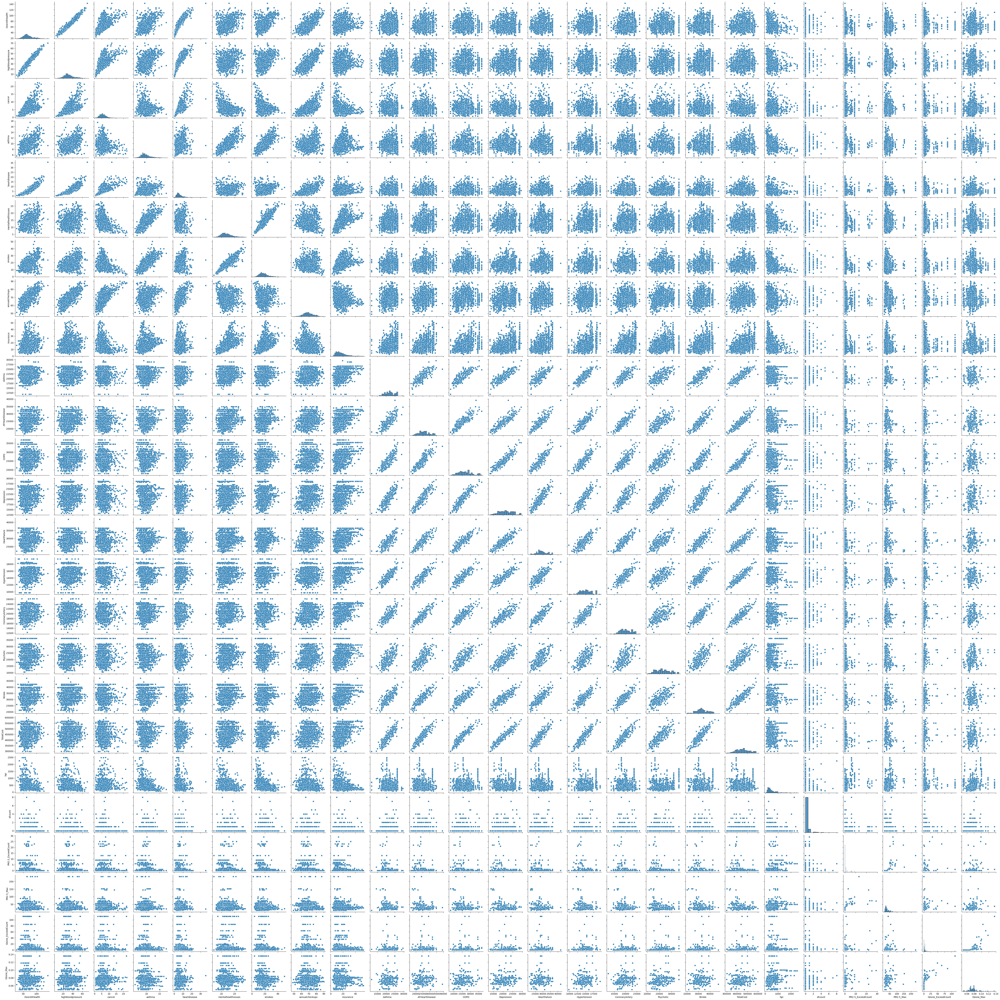

In [12]:
sns.pairplot(numvardf)